# Assignment #4 - Reinforcement Learning

### <font color="red"> DUE: Apr 16 (Tuesday) 11:00 pm </font>  

<font color="blue"> Adithi Amuru </font>

# I. Overview

The goal of the assignment is to learn and implemet Reinforcement Learning on the well-known card game of Blackjack with its types of Q-learning and SARSA. Reinforcement Learning (RL) refers to a kind of Machine Learning method in which the agent receives a delayed reward in the next time step to evaluate its previous action. In the game of Blackjack we use reinforcement learning to decide the actions to hit or stand on what we have learned from the past and pre-refined reward system. We find out how  hyperparamenters alpha, epsilon and theta function together.

# II. Problems 



## Blackjack

<img src="https://upload.wikimedia.org/wikipedia/commons/a/a2/Blackjack_game_1.JPG" width=800 />

Now, we play Blackjack! 
We have improved version of it from OpenAI Gym [Blackjack-V0](https://gym.openai.com/envs/Blackjack-v0/). Our blackjack has an additional betting option. Here follows the rule description. 


### <font color="red"> Game Introduction and Rules: </font>


Blackjack is a card game where the goal is to obtain cards that sum to as
near as possible to 21 without going over.  They're playing against a fixed
dealer.

Face cards (Jack, Queen, King) have point value 10.
Aces can either count as 11 or 1, and it's called 'usable' at 11.
This game is placed with an infinite deck (or with replacement).

The game starts with each player getting two face up cards and dealer
having one face up and face down card and the player needs to bet an 
amount of money within range of 1 to max bet (10). 
Note: Face up means that you will know what the card is.

The player can request additional cards (hit=1) until they decide to stop
(stick=0) or exceed 21 (bust).

After the player sticks, the dealer reveals their facedown card, and draws
until their sum is 17 or greater (fixed policy).  If the dealer goes bust the player wins.
You won't see the dealer's facedown card, just you will know if you have or lost
and you will get appropriate reward of +1 if you win, -1 if you loose or 0 if the match
is drawn.
(It is freedom of choice for you to change the reward function. If you want to change, you should explain the reason of the change.)

If the player wins, the amount he has bet will be doubled and given back. 
If the player and dealer have the same sum, then its a draw and the player will get
back the money he has bet. 
If the player loses then, the money he bet will be lost. 
If neither player nor dealer busts, the outcome (win, lose, draw) is
decided by whose sum is closer to 21. You are free to change the reward function to make it 
learn more efficiently. (i.e.,  the amount of money the user is winning after each round). 

Regardless of the number of players on the table, each player will be just playing against the 
dealer independently of the other players.

# Q-learning and SARSA

### Q-learning

Q-learning (Watkins,  1989) is a simple way for agents to learn  how to act optimally in controlled  Markoviandomains.  It amounts to an incremental  method  for dynamic programming which  imposes  limited computationaldemands. It works by successively improving its evaluations of the quality of particular actions at particular  states.

Q-learning uses temporal differences to estimate the value of $Q*(s,a)$. In Q-learning, the agent maintains a table of $Q[S,A]$, where S is the set of states and A is the set of actions. $Q[s,a]$ represents its current estimate of $Q*(s,a)$.

An experience $⟨s,a,r,s'⟩$ provides one data point for the value of Q(s,a). The data point is that the agent received the future value of $$r+ γV(s'), where V(s') =maxa' Q(s',a'); $$ this is the actual current reward plus the discounted estimated future value. This new data point is called a return. The agent can use the temporal difference equation to update its estimate for Q(s,a):$$ Q[s,a] ←Q[s,a] + α(r+ γmaxa' Q[s',a'] - Q[s,a]) $$
or, equivalently,$$ Q[s,a] ←(1-α) Q[s,a] + α(r+ γmaxa' Q[s',a'])$$

### SARSA

The SARSA algorithm is an On-Policy algorithm for TD-Learning. The major difference between it and Q-Learning, is that the maximum reward for the next state is not necessarily used for updating the Q-values. Instead, a new action, and therefore reward, is selected using the same policy that determined the original action. The name SARSA actually comes from the fact that the updates are done using the quintuple $Q(s, a, r, s', a')$. Where: $s$, $a$ are the original state and action, $r$ is the reward observed in the following state and $s', a'$ are the new state-action pair. 

This name simply reflects the fact that the main function for updating the Q-value depends on the current state of the agent $"S1"$, the action the agent chooses $"A1"$, the reward $"R"$ the agent gets for choosing this action, the state $"S2"$ that the agent enters after taking that action, and finally the next action $"A2"$ the agent choose in its new state. The acronym for the quintuple $(st, at, rt, st+1, at+1)$ is SARSA

$$ Q(st,at)←Q(st,at)+α[rt+γQ(st+1,at+1)−Q(st,at)] $$

__Learning rate (alpha)__

The learning rate determines to what extent newly acquired information overrides old information. A factor of 0 will make the agent not learn anything, while a factor of 1 would make the agent consider only the most recent information.

__Discount factor (gamma)__

The discount factor determines the importance of future rewards. A factor of 0 makes the agent "opportunistic" by only considering current rewards, while a factor approaching 1 will make it strive for a long-term high reward. If the discount factor meets or exceeds 1, the $Q$ values may diverge.

__Initial conditions $(Q(s0, a0))$__

Since SARSA is an iterative algorithm, it implicitly assumes an initial condition before the first update occurs. A low (infinite) initial value, also known as "optimistic initial conditions", can encourage exploration: no matter what action takes place, the update rule causes it to have higher values than the other alternative, thus increasing their choice probability. 
The first time an action is taken the reward is used to set the value of $Q$. This allows immediate learning in case of fixed deterministic rewards. This resetting-of-initial-conditions (RIC) approach seems to be consistent with human behavior in repeated binary choice experiments.

## BlackJack Environment

In [29]:
import collections
import numpy as np
import matplotlib.pyplot as plt
import gym
from gym import spaces
from gym.utils import seeding
%matplotlib inline

### Player class definition

Player class defines an object for each BlackJack player with a given *unique* name. It has three attributes, the player's name, current cards in hand, and total balance left to play games.  <code>get_info()</code> is getter method that prints out all three attributes.

Following functions are utilities and definition of card deck to play games and to check the game status. 

In [30]:
class Player():
    """
        
        Player class to create a player object.
        eg: player = Player("player1", start_balance = 10)
        Above declaration will be for your agent.
        All the player names should be unique or else you will get error.
        
    """
    def __init__(self, player_name, start_balance = 10):
        self.player_name = player_name
        self.card = []
        self.starter_balance = start_balance
        self.total_balance = start_balance

    def recharge_account(self):
        self.total_balance = self.starter_balance
        
    def get_info(self):
        print("Player name: {}".format(self.player_name))
        print("Player card: {}".format(self.card))
        print("Player total_balance: {}".format(self.total_balance))     

In [31]:
# 1 = Ace, 2-10 = Number cards, Jack/Queen/King = 10
deck = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 10, 10, 10]

def cmp(a, b):
    return float(a > b) - float(a < b)

def draw_card(np_random):
    return int(np_random.choice(deck))

def draw_hand(np_random):
    return [draw_card(np_random), draw_card(np_random)]


def usable_ace(hand):  # Does this hand have a usable ace?
    return 1 in hand and sum(hand) + 10 <= 21


def sum_hand(hand):  # Return current hand total
    if usable_ace(hand):
        return sum(hand) + 10
    return sum(hand)


def is_bust(hand):  # Is this hand a bust?
    return sum_hand(hand) > 21


def score(hand):  # What is the score of this hand (0 if bust)
    return 0 if is_bust(hand) else sum_hand(hand)


def is_natural(hand):  # Is this hand a natural blackjack?
    return sorted(hand) == [1, 10]

### Game Environment

The Blackjack game environment is defined as follows. Inheriting, OpenAI.Gym.Env, it overrides the interfances to enable the interfaction with the same interfaces with other OpenAI Gym environments. 

These are important member functions to be used by you:
1. add_player: You can add your player object with some initial amount of money

2. step: you need to send the action using this function, actions are hit(1) or stand(0)
        returns {'state': player info and dealer info (_get_obs), 
                 'reward': real-valued reward, 
                 'is_round_done': True/Fasle}
3. _get_obs: returns the state of the env or required information you can use to build your agent. 
             eg: {'player_info':{'player_sum_card': sum of cards, 
                                 'player_card': list of cards, 
                                 'player_total_balance': real-valued number, 
                                 'usable_ace' : True/False}, 
                 'dealer_info': dealer's first card}
4. init_round: will start a new round in the same game.
        returns {'state': player info and dealer info (_get_obs)}
          
5. reset: will reset the whole game and you will being again with the initial balance you had started the player object.
        returns nothing, will just reset the entire game.
          
6. bet_money: you can bet the amount using this method, takes in the money between (1, max_bet_cap). max_bet_cap is 10. 
        returns nothing.


In [32]:
class BlackjackEnv(gym.Env):
    """
    Simple blackjack environment
    
    Blackjack is a card game where the goal is to obtain cards that sum to as
    near as possible to 21 without going over.  They're playing against a fixed
    dealer.
    Face cards (Jack, Queen, King) have point value 10.
    Aces can either count as 11 or 1, and it's called 'usable' at 11.
    This game is placed with an infinite deck (or with replacement).
    The game starts with each (player and dealer) having one face up and one
    face down card.
    The player can request additional cards (hit=1) until they decide to stop
    (stick=0) or exceed 21 (bust).
    After the player sticks, the dealer reveals their facedown card, and draws
    until their sum is 17 or greater.  If the dealer goes bust the player wins.
    If neither player nor dealer busts, the outcome (win, lose, draw) is
    decided by whose sum is closer to 21.  The reward for winning is +1,
    drawing is 0, and losing is -1.
    The observation is: the players current sum, players current card, players balance left, 
    the dealer's one showing card (1-10 where 1 is ace),
    and whether or not the player holds a usable ace (0 or 1).
    
    Parameters
    ==========
    natural      boolean
                 option for 50% more reward on natural blackjack 
    
    """
    
    def __init__(self, natural=False):
        self.action_space = spaces.Discrete(2)
        self.observation_space = spaces.Tuple((
            spaces.Discrete(32),
            spaces.Discrete(11),
            spaces.Discrete(2)))
        self.seed()
        self.total_players = 1
        self.players = {}
        self.natural = natural
        self.dealer = []
        self.round_bet_info = {}
        self.max_bet_cap = 10

    def add_player(self, player_class):
        if player_class not in self.players and len(self.players) < self.total_players:
            self.players[player_class.player_name] = player_class
        else:
            raise Exception("Maximum number of player allowed: {}. You can increase the player count while initializing the environment".format(len(self.players)))

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def step(self, player_name, action):
        assert self.action_space.contains(action)
        if action:  # hit: add a card to players hand and return
            self.players[player_name].card.append(draw_card(self.np_random))
            if is_bust(self.players[player_name].card):
                done = True
                reward = -1
            else:
                done = False
                reward = 0
        else:  # stick: play out the dealers hand, and score
            done = True
            while sum_hand(self.dealer) < 17:
                self.dealer.append(draw_card(self.np_random))
            reward = cmp(score(self.players[player_name].card), score(self.dealer))
            if self.natural and is_natural(self.players[player_name].card) and reward == 1:
                reward = 1.5
        if done:
            self.settle_balance(int(reward), player_name)
        return {'state':self._get_obs(player_name), 'reward': reward, 'is_round_done': done}

    def _get_obs(self, player_name):
        return {'player_info':self.get_player_obs(player_name), 
                'dealer_info': self.dealer[0]}

    def get_player_obs(self, player_name):
        return {'player_sum_card':sum_hand(self.players[player_name].card), 
                'player_card':self.players[player_name].card, 
                'player_total_balance':self.players[player_name].total_balance, 
                'usable_ace' : usable_ace(self.players[player_name].card)}
    
    def get_valid_bet_amount(self, player_name):
        print("player name: {} money left: {}".format(player_name, self.players[player_name].total_balance))
        if self.players[player_name].total_balance < 1:
            return {'is_round_done': True, 'valid_bet_amount': -1}
        max_bet_upper_limit = self.players[player_name].total_balance
        if self.players[player_name].total_balance >= self.max_bet_cap:
            max_bet_upper_limit = self.max_bet_cap            
        return {'is_round_done': False, 'valid_bet_amount': list(range(1, max_bet_upper_limit+1))}
            
    def init_round(self, player_name):         
        self.dealer = draw_hand(self.np_random)
        self.players[player_name].card = draw_hand(self.np_random)
        return {'state': self._get_obs(player_name)}        

    def bet_money(self, player_name, bet_amount):
        self.players[player_name].total_balance -= bet_amount
        self.round_bet_info[player_name] = bet_amount
            
    def settle_balance(self, is_winner, player_name):
        if is_winner == 1:
            print("player winner")
            self.players[player_name].total_balance += (2 * self.round_bet_info[player_name])
        elif is_winner == 0:
            print("Draw match")
            self.players[player_name].total_balance += self.round_bet_info[player_name]
        else:
            print("player loser, wont get back the money, try next round")
    
    def reset(self, natural=False):
        for player_name, player_class in self.players.items():
            player_class.recharge_account()
        self.natural = natural
        self.dealer = []
        self.round_bet_info = {}


### Example Run with Random Players

This following code shows how to create an environment and players to play 10 games with 20 maximum rounds. This only includes random betting and random hit/stick decision making. 

In [33]:
env = BlackjackEnv()
player1 = Player('player1')
env.add_player(player1)
#Number of games
number_of_games = 10

#Number of rounds
number_of_rounds = 20

for _game in range(number_of_games):

    env.reset()
    print("-"* 50)
    print("Game Number: {}".format(_game + 1))
    print("-"* 50)
    for _round in range(number_of_rounds): 
        print("%"* 50)
        print("Game Number: {} Round Number: {}".format(_game+1, _round+1))
        print("%"* 50)
        
        #Check if you have enough money left in the account to bet, if not break and start a new game
        valid_bet_flag = env.get_valid_bet_amount(player1.player_name)
        if valid_bet_flag['is_round_done']:
            print("You are out of money ! Will go to next game !!")
            break
        bet_amount = valid_bet_flag['valid_bet_amount']
        
        #Get the observations i.e state and use it to decide how much you want to bet
        round_obs = env.init_round(player1.player_name)
        print("Initial state: {}".format(round_obs))  
        
        # If you have just $1 left in the bank, you have no choice but to bet that amount 
        # and hopefully leave it to the fate for your agent to win and continue playing or just
        # start a new game
        if len(bet_amount) == 1 and bet_amount[0] == 1:
            print("You can only bet 1. So betting only 1.")
            random_bet = 1
        else:
            random_bet = np.random.choice(bet_amount)
        print("Random Init Bet: {}".format(random_bet))
        env.bet_money(player1.player_name, random_bet)
          
        
        # Look at the state and take actions, here the actions are selected randomly
        # you can use the agent to select the action
        random_action = np.random.randint(0, 2)
        print("Action taken: {}".format(random_action))

        #Use the selected action to actually take the action in env by calling step
        round_obs = env.step(player1.player_name, random_action)
        print("State after 1st action: {}".format(round_obs))

        #Check if the game is not over, if your action is stand then the game is over, else
        #the game continues in this loop until your action is stand
        while not round_obs['is_round_done']:
            #Select an random action and take the action
            random_action = np.random.randint(0, 2)
            print("Action taken: {}".format(random_action))
            round_obs = env.step(player1.player_name, random_action)
            print("State after nth action: {}".format(round_obs))

        #Round over, but the game will continue untill you have exhausted your initial money 
        print("Balance Left: {}".format(round_obs['state']['player_info']['player_total_balance']))
        print("Round over")
        print("-%-"*30)
        if (_round + 1) == (number_of_rounds):
            print("Max number of rounds played. If you see this message, you are the winner.")

--------------------------------------------------
Game Number: 1
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: player1 money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 7
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 17
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: player1 money left: 17
Initial st

# III. Methods

## Choice of TD learning approach

We choose Q-learning as our TD-learning approach for the below reasons:

- SARSA is anon-policyalgorithm which means that whilelearning the optimal policy it uses the current estimate of the optimal policy to generate the behaviour. SARSA converges to an optimal policy as long as all state-action pairs are visited an infinite number of times and the policy converges in the limit to the greedy policy ( $ \epsilon $ = 1t).

- In Q-learning the learned action-value function, Q, directly approximates the optimal action-value function, independent of the policy being followed. This dramatically simplifies the analysis of the algorithm and enabled early convergence proofs:  all that is required for correct convergence is that all pairs continue to be updated.

- Q-learning's policy changes in long term can turn out to give a better convergence when compared with SARSA , and blackjack being a game with a good amount of learning curve, it might be beneficial to choose Q-Learning over SARSA.

- Q-learning directly learns the optimal policy, where as SARSA learns a almost-optimal policy while exploring. If you want to learn an optimal policy using SARSA, then you will need to decide on a strategy to decay $ \epsilon $ in $ \epsilon $ -greedy action choice, which may become a complicated hyperparameter to tune. This will be ideal in the situation like blackjack, where the most optimal policy is ideal when we are iterating and drawing step by step. Hence Q-Learning was chosen.

### Choice of Function approximation

We should be choosing different features for different actions at each step of Reinforcement Learning algorithm. We focus on the function approximation, i.e. the list of features which are used to predict the forthcoming steps in our problem(blackjack).

Here we notice that the total of the cards are the representation of the states we are in. We use these parameters approximate the ideal action. We use MaxQ, from the actions at the given point when compared to the actions in the future state of the given next possible states. This is done using the MaxQ reinforcement learning, and the process of doing this may be the best way to achieve convergence. 

>- Approximating with exploited information would be ideal, especially in blackjack where the rules are the pre-bound information we are setting.
>- We choose MaxQ , since it is the way we are combining the possible state actions with respect to the future state-actions. At a given point we evaluate the options to us and pick the best possible approximation for the same in a linear manner. This would be the best method to deal with the given problem.
>- For the major part of our approximation, we use epsilon decay algorithm.
>- Learning rate is how big is taken a leap in finding optimal policy. In the terms of simple Q-Learning it's how much you are updating the Q value with each step. Higher alpha means you are updating your Q values in big steps. When the agent is learning you should decay this to stabilize your model output which eventually converges to an optimal policy.
>- Epsilon is used when we are selecting specific actions base on the Q values we already have. As an example if we select pure greedy method ( $\epsilon$ = 0 ) then we are always selecting the highest q value among the all the q values for a specific state. This causes issue in exploration as we can get stuck easily at a local optima.
>- Therefore , we introduce a greedy algorithm at the final steps to arrive at the solution/convergence. This is the goal we are expecting to see,hence we use epsilon decay to arrive closer to the optimum.
>- In conclusion learning rate is associated with how big you take a step and epsilon is associated with how random you choose an action. As the learning goes on, both should decaye to stabilize and exploit the learned policy which converges to an optimal one.

## RLAgent for Blackjack

In [34]:
import random
class Agent():

    def __init__(self, env, epsilon=1.0, alpha=0.5, gamma=0.9, num_episodes_to_train=30000, player_name='Adithi'):
        self.env = env
        self.valid_actions = list(range(self.env.action_space.n))
        # Set parameters of the learning agent
        self.Q = dict()      # Q-table which will be a dictionary of tuples
        self.epsilon = 0     # Random exploration factor
        self.alpha = 0       # Learning factor
        self.gamma = 0       # Discount factor- closer to 1 learns well into distant future
        self.num_episodes_to_train = 0
        self.player = Player(player_name)

    def getdecipher(self, round_obs):
        return (round_obs['player_info']['player_sum_card'], round_obs['player_info']['player_total_balance'],
                round_obs['player_info']['usable_ace'])

    def init_decay(self,num_episodes_to_train):
        self.num_episodes_to_train = num_episodes_to_train
        self.small_decrement = (0.1 * self.epsilon) / (0.3 * self.num_episodes_to_train)
        self.big_decrement = (0.8 * self.epsilon) / (0.4 * self.num_episodes_to_train)
        self.num_episodes_to_train_left = self.num_episodes_to_train

    def update_param(self):
        if self.num_episodes_to_train_left > 0.7 * self.num_episodes_to_train:
            self.epsilon -= self.small_decrement
        elif self.num_episodes_to_train_left > 0.3 * self.num_episodes_to_train:
            self.epsilon -= self.big_decrement
        elif self.num_episodes_to_train_left > 0:
            self.epsilon -= self.small_decrement
        else:
            self.epsilon = 0.0
            self.alpha = 0.0
        self.num_episodes_to_train_left -= 1

    def gen_Q_if_new_obs(self, observation):
        if observation not in self.Q:
            if observation == None:
                pass
            else:
                print('---------------------')
                print(observation)
                print('---------------------')
                self.Q[observation] = dict((action, 0.0) for action in self.valid_actions)

    def get_maxQ(self, observation):
        self.gen_Q_if_new_obs(observation)
        return max(self.Q[observation].values())
   
    def choose_action(self, observation):
        self.gen_Q_if_new_obs(observation)
        if random.random() > self.epsilon:
            maxQ = self.get_maxQ(observation)
            action = random.choice([k for k in self.Q[observation].keys()
                                    if self.Q[observation][k] == maxQ])
        else:
            action = random.choice(self.valid_actions)
        self.update_param()
        return action

    def get_action(self, observation):
        self.gen_Q_if_new_obs(observation)
        maxQ = self.get_maxQ(observation)
        return random.choice([k for k in self.Q[observation].keys()
                                if self.Q[observation][k] == maxQ])

    
    def learn(self, observation, action, reward, next_observation):
        if observation != None:
            self.Q[observation][action] += self.alpha * (reward
                                                     + (self.gamma * self.get_maxQ(next_observation))
                                                     - self.Q[observation][action])

    def train(self, **params):
        # parameters
        self.gamma = params.pop('gamma', 0.2)
        self.alpha = params.pop('alpha', 0.5)
        self.epsilon= params.pop('epsilon', 1.0)
        num_samples= params.pop('num_samples', 1000)
        num_rounds= params.pop('num_rounds', 1000)
        num_episodes_to_train = params.pop('num_episodes_to_train',800) 

        self.init_decay(num_episodes_to_train)    
        average_payouts = []   

        for _game in range(num_samples):
            self.env.reset()
            print("-"* 50)
            print("Game Number: {}".format(_game + 1))
            print("-"* 50)
            total_payout = 0
            for _round in range(num_rounds):
                print("%"* 50)
                print("Game Number: {} Round Number: {}".format(_game+1, _round+1))
                print("%"* 50)
                #Check if you have enough money left in the account to bet, if not break and start a new game
                valid_bet_flag = self.env.get_valid_bet_amount(self.player.player_name)
                if valid_bet_flag['is_round_done']:
                    print("You are out of money ! Will go to next game !!")
                    break
                bet_amount = valid_bet_flag['valid_bet_amount']
                #Get the observations i.e state and use it to decide how much you want to bet
                round_obs = self.env.init_round(self.player.player_name)
                observation = self.getdecipher(round_obs['state'])
                print("Initial state: {}".format(round_obs)) 

                # If you have just $1 left in the bank, you have no choice but to bet that amount
                # and hopefully leave it to the fate for your agent to win and continue playing or just
                # start a new game

                if len(bet_amount) == 1 and bet_amount[0] == 1:
                    print("You can only bet 1. So betting only 1.")
                    random_bet = 1
                else:
                    random_bet = np.random.choice(bet_amount)

                #np.random.choice(bet_amount)
                print("Random Init Bet: {}".format(random_bet))
                self.env.bet_money(self.player.player_name, random_bet)

                # Look at the state and take actions, here the actions are selected randomly
                # you can use the agent to select the action
                random_action = self.choose_action(observation)
                print("Action taken: {}".format(random_action))

                #Use the selected action to actually take the action in env by calling step
                round_obs = self.env.step(self.player.player_name, random_action)
                next_observation = self.getdecipher(round_obs['state'])
                print("State after 1st action: {}".format(round_obs))
                self.learn(observation, random_action, round_obs['reward'], next_observation)           

                total_payout += round_obs['reward']
              
                observation = self.getdecipher(round_obs['state'])              

                #Check if the game is not over, if your action is stand then the game is over, else
                #the game continues in this loop until your action is stand

                while not round_obs['is_round_done']:
                    #Select an random action and take the action
                    random_action = self.choose_action(observation)
                    print("Action taken: {}".format(random_action))
                    round_obs = self.env.step(self.player.player_name, random_action)
                    print("State after nth action: {}".format(round_obs))

 
                #Round over, but the game will continue untill you have exhausted your initial money
                print("Balance Left: {}".format(round_obs['state']['player_info']['player_total_balance']))
                print("Round over")
                print("-%-"*30)
                if (_round + 1) == (number_of_rounds):
                    print("Max number of rounds played. If you see this message, you are the winner.")
                average_payouts.append(total_payout)
        return average_payouts

    def test(self,num_rounds):
        agent_reward = []
        agent_win = 0
        agent_loss = 0
        agent_draw = 0
        for i in range(num_rounds+1):
            self.env.reset()
            # Start The Round and Start Observation
            self.env.bet_money(self.player.player_name, random_bet)
            test_round_obs = self.env.init_round(self.player.player_name)
            obs = self.getdecipher(test_round_obs['state'])
            
            # Init Payouts
            total_payout = 0       
            is_round_done = False           

            while not is_round_done:
                action = self.get_action(obs)
                get_obs = self.env.step(self.player.player_name, action)
             
                test_nxt_obs = self.getdecipher(get_obs['state'])
                total_payout += get_obs['reward']
                is_round_done = get_obs['is_round_done']
                test_round_obs = test_nxt_obs

            if(total_payout >0):
                agent_win += 1
            elif(total_payout < 0):
                agent_loss += 1
            else:
                agent_draw += 1

            agent_reward.append(total_payout)
        winPect = agent_win / num_rounds * 100
        lossPect = agent_loss / num_rounds * 100
        drawPect = agent_draw / num_rounds * 100
        return agent_reward , winPect, lossPect, drawPect

    

    def show_strategy(self):
        list_players_hand = range(1, 22)
        list_dealers_upcard = range(1, 11)
        # Print headers to give more information about output
        print ("{:^10} | {:^51} | {:^51}".format("Player's","Dealer's upcard when ace is not usable", "Dealer's upcard when ace is usable"))
        print ("{0:^10} | {1} | {1}".format("Hand", [str(upcard) if not upcard==1 else 'A'
                                                        for upcard in list_dealers_upcard]))

        for players_hand in list_players_hand:
            actions_usable = []
            actions_not_usable = []
            for dealers_upcard in list_dealers_upcard:
                observation = (players_hand, dealers_upcard, False)
                actions_not_usable.append(self.readable_action(observation))
                observation = (players_hand, dealers_upcard, True)
                actions_usable.append(self.readable_action(observation))
            print ("{:>10} | {}  | {}".format(players_hand, actions_not_usable, actions_usable))

    def readable_action(self,observation):
        """
        Pass observation to agent and get human readable action
        H is hit, S is stick and '-' means the state is unseen and a random action is taken
        """
        if observation not in self.Q:
            action = "-"
        else:
            action = "H" if self.get_action(observation) else "S"   
        return action

### Exploring Class Agent()
1. __init:__ decides the initial values for epsilon, gamma and alpha. It also set a default values for number of episodes and initiates the player name.
2. __getdecipher:__ 
3. __init_decay:__ The function is used to decay the epsilon value.
4. __update_param:__ Updates the parameters based on the decayed epsilon value based on the number of episodes left to train.
5. __gen_Q_if_new_obs:__ generates a new Q value if there is a change in the state based on the observation
6. __get_maxQ:__ Returns the max value of the Q available.
7. __choose_action:__ returns the action to hit or stand based on the current state observation.
8. __get_action:__ returns a random action hit or stand.
9. __learn:__ learns the rward of the current state and plans the next observation based on th action.
10. __train:__ Trains the system to learn from the previous states, observations(sum of cards drawn), money left and action to be taken based on states. 
11. __test:__ Tests the given number of episodes based on the training memorized.
12. __show_strategy:__ Prints the observation for the round being played and the next action to be taken. Also the value of ace used i.e. 1 or 11 is taken into consideration.
13. __readable_action:__ Pass observation to agent and get human readable action. H is hit, S is stick and '-' means the state is unseen and a random action is taken

In [35]:
def plot_result_blackJack(average_payouts,agent):
    plot_avg_reward(average_payouts)
    try_plot(agent)

def try_plot(agent):
    agent.show_strategy()
    
def summary(diff,wP, lP, dP):
    print("Your Winning percentage is ", wP)
    print("Your Losing percentage is ", lP)
    print("The Percentage of game being a Draw is ", dP)
    print("You have lost ",diff*-1," more games than the games you Won")
    
def plot_avg_reward(average_payouts):
    plt.plot(average_payouts,'o')           
    plt.xlabel('num_samples')
    plt.ylabel('payout after 1000 rounds')
    plt.show()      
    print ("Average payout after {} rounds is {}".format(num_rounds, sum(average_payouts)/(num_samples)))


__Plotting the graphs and printing the results of each round played__


1. __plot_result_blackJack:__ Plotting the average playouts agent wise.
2. __summary:__ The summary of the winning, loosing and draw percentages.
3. __plot_avg_reward:__ Used to plaotting the average payouts for all the rounds.


# IV - Results

__Discounting factor__ $\gamma$: The discount factor $\gamma$ determines the importance of future rewards. A factor of 0 will make the agent "myopic" (or short-sighted) by only considering current rewards, i.e. $r_{t}$, while a factor approaching 1 will make it strive for a long-term high reward.

__Learning rate__ $\alpha$: The learning rate or step size determines to what extent newly acquired information overrides old information. A factor of 0 makes the agent learn nothing (exclusively exploiting prior knowledge), while a factor of 1 makes the agent consider only the most recent information (ignoring prior knowledge to explore possibilities). In fully deterministic environments, a learning rate of $\alpha_{t} = 1$ is optimal 

__Greedy choice__ $\epsilon$ : A simple combination of the greedy and random approaches yields one of the most used exploration strategies: $\epsilon$-greedy. In this approach the agent chooses what it believes to be the optimal action most of the time, but occasionally acts randomly. This way the agent takes actions which it may not estimate to be ideal, but may provide new information to the agent. The $\epsilon$ in $\epsilon$-greedy is an adjustable parameter which determines the probability of taking a random, rather than principled, action

#### Here we have choosen the values for epsilon, alpha and gamma below.

$\gamma=1$

$\alpha=0.5$

$\epsilon=0.25$

- __Gamma__ having the value 1 determines the importance of the Future Rewards and hence as Future Rewards are important we are selecting it as 1
- __Alpha__ Having the Value of 0.5 yielded the best result as compared to the higher(New) or lower(Old) value of same and it is a perfect fit which determines the perfect combinition of old and new data and hence we select 0.5 as our value
- __Episilon__ It helps our Agent to explore more options when it comes to selecting the choice of Ace and the choice of action based on the next or previous information. This would take in to consideration many other values which are not that important to make a decision over an action and hence it should not be much higher but lower as compared to the normal. so we selected the rate of 0.25 as it yielded a good result.

In [36]:
envb = BlackjackEnv()
sam = Player('Adithi')
envb.add_player(sam)
agent = Agent(envb)
num_rounds = 200
num_samples = 200
num_episodes_to_train = 0.8* num_rounds
# epsilon=0.25, alpha=0.5, gamma=1
average_payouts = agent.train(epsilon=0.25, alpha=0.5, gamma=1,num_rounds = num_rounds,num_samples = num_samples,num_episodes_to_train=num_episodes_to_train)
agent.show_strategy()

--------------------------------------------------
Game Number: 1
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [9, 3], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 5
---------------------
(12, 10, False)
---------------------
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [9, 3], 'player_total_balance': 15, 'usable_ace': False}, 'dealer_info': 7}, 'reward': 1.0, 'is_round_done': True}
---------------------
(12, 15, False)
---------------------
Balance Left: 15
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 9 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 16
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [2, 10], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 1}}
Random Init Bet: 6
---------------------
(12, 16, False)
---------------------
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [2, 10], 'player_total_balance': 22, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 1.0, 'is_round_done': True}
---------------------
(12, 22, False)
---------------------
Balance Left: 22
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 9 Round Number: 8
%%%%%%%%

Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [7, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 27, 'player_card': [7, 10, 10], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
---------------------
(27, 0, False)
---------------------
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 14 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 15
-----------------------------------------------

Balance Left: 20
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 26 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 20
Initial state: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [6, 5], 'player_total_balance': 20, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 9
---------------------
(11, 20, False)
---------------------
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [6, 5], 'player_total_balance': 11, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 11
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 26 Round Number:

Game Number: 31 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 32
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 32 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 3}}
Random Init Bet: 5
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 15, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 15
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%

player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 9, 'player_card': [3, 6], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 5}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 47 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 48
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 48 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [3, 5], 'player_total_balance': 10, 'usable_

Initial state: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [4, 7], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 4}}
Random Init Bet: 1
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [4, 7], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 4}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 53 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1], 'player_total_balance': 7, 'usable_ace': True}, 'dealer_info': 10}}
Random Init Bet: 7
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_

--------------------------------------------------
Game Number: 68
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 68 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1], 'player_total_balance': 10, 'usable_ace': True}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [10, 1, 3], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [10, 1, 3], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 9
Round over
-%--%--

Game Number: 72 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 17
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [1, 4], 'player_total_balance': 17, 'usable_ace': True}, 'dealer_info': 10}}
Random Init Bet: 9
---------------------
(15, 17, True)
---------------------
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [1, 4, 7], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [1, 4, 7, 7], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [1, 4, 7, 7, 1], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}, 'reward':

player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 30, 'player_card': [10, 8, 2, 10], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 6}, 'reward': -1, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 82 Round Number: 6
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 83
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 83 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 4, 'player_card': [2, 2], 'player_total_balance': 10, '

Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 87 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 8
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [10, 4], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 5}}
Random Init Bet: 7
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 4, 2], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [10, 4, 2, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 5}, 'reward': -1, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%-

(18, 31, True)
---------------------
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [7, 1, 8], 'player_total_balance': 28, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
---------------------
(16, 28, False)
---------------------
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [7, 1, 8, 2], 'player_total_balance': 28, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 28, 'player_card': [7, 1, 8, 2, 10], 'player_total_balance': 28, 'usable_ace': False}, 'dealer_info': 2}, 'reward': -1, 'is_round_done': True}
Balance Left: 28
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Gam

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 102 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 12
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [6, 6], 'player_total_balance': 12, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 4
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [6, 6, 2], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 6, 2, 2], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [6, 6, 2, 2, 10], 'player_total_balance': 8, 'u

Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [4, 9], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 5
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 117 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 5
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [9, 1], 'player_total_balance': 5, 'usable_ace': True}, 'dealer_info': 3}}
Random Init Bet: 4
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [9, 1, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after n

player name: Adithi money left: 9
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [7, 5], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 2
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [7, 5], 'player_total_balance': 11, 'usable_ace': False}, 'dealer_info': 7}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 11
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 123 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 11
Initial state: {'state': {'player_info': {'player_sum_card': 10, 'player_card': [8, 2], 'player_total_balance': 11, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 8
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 141 Round Number: 6
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 2
Initial state: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [9, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 2
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [9, 10, 7], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 141 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
---------------------------------------------

Game Number: 147 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 13
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [10, 5], 'player_total_balance': 13, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 24, 'player_card': [10, 5, 9], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
---------------------
(24, 10, False)
---------------------
Balance Left: 10
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 147 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_car

State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [9, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 169 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 1
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 10], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 9}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%

Random Init Bet: 6
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [2, 5, 6], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [2, 5, 6], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 16
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 172 Round Number: 23
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 16
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [6, 1], 'player_total_balance': 16, 'usable_ace': True}, 'dealer_info': 2}}
Random Init Bet: 9
---------------------
(17, 16, True)
---------------------

State after nth action: {'state': {'player_info': {'player_sum_card': 30, 'player_card': [1, 5, 10, 4, 10], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 192 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 9, 'player_card': [3, 6], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [3, 6, 2], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 6}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 11, 

You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [6, 8], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 196 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 197
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 197 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'p

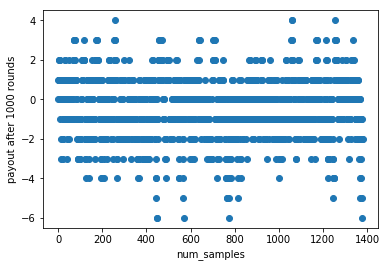

Average payout after 200 rounds is -3.365
 Player's  |       Dealer's upcard when ace is not usable        |         Dealer's upcard when ace is usable         
   Hand    | ['A', '2', '3', '4', '5', '6', '7', '8', '9', '10'] | ['A', '2', '3', '4', '5', '6', '7', '8', '9', '10']
         1 | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         2 | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         3 | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         4 | ['H', 'S', 'H', 'H', 'S', 'S', '-', '-', 'H', 'S']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         5 | ['-', 'S', 'H', 'H', 'H', 'H', 'S', 'H', '-', 'S']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         6 | ['-', 'H', 'H', 'H', 'H', 'S', 'S', '-', 'S', 'H']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         7 |

In [37]:
plot_result_blackJack(average_payouts,agent)

In [38]:
rew,wP,lP,dP = agent.test(100)
summary(np.sum(rew) , wP, lP, dP)

player winner
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player winner
player loser, wont get back the money, try next round
player winner
Draw match
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player winner
player loser, wont get back the money, try next round
player winner
player winner
player loser, wont get back the money, try next round
player winner
player winner
player winner
player loser, wont get back the money, try next round
player winner
player winner
player winner
player loser, wont get back the money, try next round
player winner
player winner
Draw match
player winner
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser

In [42]:
envb = BlackjackEnv()
sam = Player('Adithi')
envb.add_player(sam)
agent = Agent(envb)
num_rounds = 2000
num_samples = 2000
num_episodes_to_train = 0.8* num_rounds
# epsilon=0.5, alpha=0.25, gamma=0.75
average_payouts = agent.train(epsilon=0.5, alpha=0.25, gamma=0.75,num_rounds = num_rounds,num_samples = num_samples,num_episodes_to_train=num_episodes_to_train)
agent.show_strategy()

--------------------------------------------------
Game Number: 1
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [10, 2], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 8
---------------------
(12, 10, False)
---------------------
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [10, 2], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1.0, 'is_round_done': True}
---------------------
(12, 2, False)
---------------------
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%

player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 4}, 'reward': 1.0, 'is_round_done': True}
---------------------
(14, 17, False)
---------------------
Balance Left: 17
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 16 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 17
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [6, 6], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 4}}
Random Init Bet: 1
---------------------
(12, 17, False)
---------------------
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [6, 6], 'player_total_balance': 18, 'usable_ace': False}, 'dealer_info': 4}, '

player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 25, 'player_card': [10, 10, 5], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 6}, 'reward': -1, 'is_round_done': True}
---------------------
(25, 4, False)
---------------------
Balance Left: 4
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 31 Round Number: 11
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 4
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [10, 8], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 5}}
Random Init Bet: 2
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [10, 8, 8], 'player_total_balance': 2, 'usable_ace': False

Game Number: 49 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [1, 7], 'player_total_balance': 10, 'usable_ace': True}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [1, 7], 'player_total_balance': 9, 'usable_ace': True}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
---------------------
(18, 9, True)
---------------------
Balance Left: 9
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 49 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 9
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [3, 10],

player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [6, 4, 10], 'player_total_balance': 37, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 37
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 58 Round Number: 46
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 37
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [8, 10], 'player_total_balance': 37, 'usable_ace': False}, 'dealer_info': 3}}
Random Init Bet: 8
---------------------
(18, 37, False)
---------------------
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [8, 10], 'player_total_balance': 29, 'usable_ace': False}, 'dealer_info': 3}, 'reward': -1.0,

State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [8, 8], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 70 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 71
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 71 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [7, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 5}}
Random Init Bet: 

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 86 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [6, 9], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 9}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [6, 9], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 86 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
-----------

Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 20, 'usable_ace': False}, 'dealer_info': 9}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 20
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 106 Round Number: 13
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 20
Initial state: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [4, 4], 'player_total_balance': 20, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 1
---------------------
(8, 20, False)
---------------------
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [4, 4, 1], 'player_total_balance': 19, 'usable_ace': True}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
-----------------

Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 121 Round Number: 15
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1], 'player_total_balance': 1, 'usable_ace': True}, 'dealer_info': 9}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1], 'player_total_balance': 2, 'usable_ace': True}, 'dealer_info': 9}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 121 Round Number: 16
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 141 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 14
Initial state: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 9], 'player_total_balance': 14, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 6
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [10, 9, 3], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 141 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 8
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 10],

player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [7, 7], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 153 Round Number: 23
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [1, 1], 'player_total_balance': 1, 'usable_ace': True}, 'dealer_info': 4}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
---------------------
(12, 1, True)
---------------------
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [1, 1, 1], 'player_total_balance': 0, 'usable_ace': True}, 'dealer_info': 4},

Balance Left: 28
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
Max number of rounds played. If you see this message, you are the winner.
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 174 Round Number: 21
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 28
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [5, 10], 'player_total_balance': 28, 'usable_ace': False}, 'dealer_info': 5}}
Random Init Bet: 2
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [5, 10], 'player_total_balance': 26, 'usable_ace': False}, 'dealer_info': 5}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 26
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 

State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [4, 3, 8], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [4, 3, 8, 6], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 23, 'player_card': [4, 3, 8, 6, 2], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 5}, 'reward': -1, 'is_round_done': True}
Balance Left: 16
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 189 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1

--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 203 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1], 'player_total_balance': 10, 'usable_ace': True}, 'dealer_info': 2}}
Random Init Bet: 1
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1], 'player_total_balance': 11, 'usable_ace': True}, 'dealer_info': 2}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 11
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 203 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 11
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': 

Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [8, 2, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 9}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [8, 2, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 221 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 9, 'player_card': [2, 7], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 1
Sta

Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [8, 2, 10], 'player_total_balance': 18, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 18
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 245 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 18
Initial state: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 9], 'player_total_balance': 18, 'usable_ace': False}, 'dealer_info': 4}}
Random Init Bet: 5
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 9], 'player_total_balance': 23, 'usable_ace': False}, 'dealer_info': 4}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 23
Round over
-%--%--%--%--%--%--%--%--%--%--%

Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 263 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [1, 9], 'player_total_balance': 3, 'usable_ace': True}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 0
Draw match
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [1, 9], 'player_total_balance': 3, 'usable_ace': True}, 'dealer_info': 10}, 'reward': 0.0, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 263 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'stat

State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [2, 1, 6], 'player_total_balance': 6, 'usable_ace': True}, 'dealer_info': 9}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [2, 1, 6], 'player_total_balance': 12, 'usable_ace': True}, 'dealer_info': 9}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 12
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 278 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 12
Initial state: {'state': {'player_info': {'player_sum_card': 4, 'player_card': [2, 2], 'player_total_balance': 12, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 10
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {

Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'player_total_balance': 36, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 36
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 303 Round Number: 11
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 36
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [1, 6], 'player_total_balance': 36, 'usable_ace': True}, 'dealer_info': 10}}
Random Init Bet: 8
---------------------
(17, 36, True)
---------------------
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [1, 6, 10], 'player_total_balance': 28, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0


You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 328
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 328 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 6
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 6}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 4
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 328 Round Number: 2
%%%%%%%%%%

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 6
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [10, 7], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [10, 7], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 346 Round Number: 19
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [8, 3], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 1}}
Random Init Bet: 1

player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 361
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 361 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [8, 9], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [8, 9, 3], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0
Draw match
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [8, 9, 3], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0.0, 'is_round_done': Tr

Game Number: 379 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [3, 5], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 8
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [3, 5, 7], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [3, 5, 7], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 379 Round Number: 2
%%%

State after nth action: {'state': {'player_info': {'player_sum_card': 24, 'player_card': [7, 5, 3, 9], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 5}, 'reward': -1, 'is_round_done': True}
Balance Left: 10
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 399 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [1, 10], 'player_total_balance': 10, 'usable_ace': True}, 'dealer_info': 5}}
Random Init Bet: 5
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [1, 10], 'player_total_balance': 15, 'usable_ace': True}, 'dealer_info': 5}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 15
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--

Game Number: 417 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [5, 6], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 2
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [5, 6, 4], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 7}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [5, 6, 4], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 417 Round Number: 2
%%%%%

Game Number: 438 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 13
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'player_total_balance': 13, 'usable_ace': False}, 'dealer_info': 8}}
Random Init Bet: 5
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 8}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 438 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 8
Initial state: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1], 'player_total_balance': 8, 'usable_ace': True}, 'deal

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 455 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 35
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 35, 'usable_ace': False}, 'dealer_info': 3}}
Random Init Bet: 9
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 26, 'usable_ace': False}, 'dealer_info': 3}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 26
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 455 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 474 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [1, 9], 'player_total_balance': 7, 'usable_ace': True}, 'dealer_info': 1}}
Random Init Bet: 4
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [1, 9], 'player_total_balance': 3, 'usable_ace': True}, 'dealer_info': 1}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 474 Round Number: 6
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initia

Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 488 Round Number: 18
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 489
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 489 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [3, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 5
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [3, 10, 9], 'player_total_balance': 5, '

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 508 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1], 'player_total_balance': 1, 'usable_ace': True}, 'dealer_info': 7}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1], 'player_total_balance': 2, 'usable_ace': True}, 'dealer_info': 7}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 508 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 2
Initia

Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [6, 6, 5], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 27, 'player_card': [6, 6, 5, 10], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 1}, 'reward': -1, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 528 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 529
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 8, 'player_card': [5, 3], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 3}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [5, 3, 10], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [5, 3, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 554 Round Number: 14
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 2
Initia

player name: Adithi money left: 5
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [10, 5], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 5
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [10, 5, 3], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 28, 'player_card': [10, 5, 3, 10], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 583 Round Number: 6
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 

Game Number: 606 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 607
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 607 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [4, 8], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 3
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [4, 8, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%

State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [5, 10], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 1}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 4
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 629 Round Number: 20
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 4
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [9, 9], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 4
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [9, 9], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%

Balance Left: 14
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 653 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 14
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [7, 10], 'player_total_balance': 14, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 7
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 24, 'player_card': [7, 10, 7], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 653 Round Number: 9
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
playe

Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 676 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 677
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 677 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [6, 1], 'player_total_balance': 10, 'usable_ace': True}, 'dealer_info': 8}}
Random Init Bet: 5
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [6, 1], 'player_total_balance': 5, 'usable_

Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 698 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 2
Initial state: {'state': {'player_info': {'player_sum_card': 6, 'player_card': [4, 2], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 1}}
Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [4, 2, 9], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [4, 2, 9, 7], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 1}, 'reward': -1, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%

Game Number: 724 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [10, 4], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 2
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 24, 'player_card': [10, 4, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 724 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [7, 5], 'player_total_balance': 1, 'usable_ace': False}, 'deal

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 744 Round Number: 22
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 22
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 22, 'usable_ace': False}, 'dealer_info': 2}}
Random Init Bet: 2
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 24, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 24
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 744 Round Number: 23
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 24
Initial state: {'state': {'player_

Initial state: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [1, 10], 'player_total_balance': 23, 'usable_ace': True}, 'dealer_info': 2}}
Random Init Bet: 7
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [1, 10, 3], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [1, 10, 3, 7], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 28, 'player_card': [1, 10, 3, 7, 7], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 2}, 'reward': -1, 'is_round_done': True}
Balance Left: 16
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 787 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 788
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 788 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [5, 10], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 2}}
Random Init Bet: 10
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [5, 10, 3], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_ca

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 33
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [10, 2], 'player_total_balance': 33, 'usable_ace': False}, 'dealer_info': 2}}
Random Init Bet: 4
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [10, 2], 'player_total_balance': 37, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 37
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 804 Round Number: 13
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 37
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'player_total_balance': 37, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 8
Action taken: 1
player loser, wont

Random Init Bet: 2
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [9, 3, 10], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 6}, 'reward': -1, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 825 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 8
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [8, 9], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 5
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [8, 9, 9], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}, 're

Game Number: 850
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 850 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [6, 7], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [6, 7, 7], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 6}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [6, 7, 7], 'player_total_balance': 13, 'usable_ace': False}, 'dealer_info': 6}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 13
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%

Game Number: 872 Round Number: 18
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 4
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 3
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 7}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 872 Round Number: 19
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [3, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 7
Acti

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 893 Round Number: 15
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [10, 3], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 5}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 3, 3], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 3, 3], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%

Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 9], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 915 Round Number: 13
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 2
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [9, 6], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 7}}
Random Init Bet: 1
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [9, 6], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1.0, 'is_round_d

player name: Adithi money left: 2
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [9, 6], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [9, 6], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 933 Round Number: 11
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [5, 7], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 1}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken:

Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [6, 8, 6], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [6, 8, 6], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 954 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [5, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 4}}
Random Init Bet: 5
Action taken: 0
player loser, wont get back the money, try ne

player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 24, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 24
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 980 Round Number: 6
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 24
Initial state: {'state': {'player_info': {'player_sum_card': 7, 'player_card': [3, 4], 'player_total_balance': 24, 'usable_ace': False}, 'dealer_info': 1}}
Random Init Bet: 8
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [3, 4, 1], 'player_total_balance': 16, 'usable_ace': True}, 'dealer_info': 1}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 1006
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1006 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [6, 9], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [6, 9, 5], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 9}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [6, 9, 5], 'player_total_balance': 13, 'usable_ace': False}, 

player name: Adithi money left: 5
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [5, 1], 'player_total_balance': 5, 'usable_ace': True}, 'dealer_info': 3}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [5, 1, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 24, 'player_card': [5, 1, 10, 8], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 3}, 'reward': -1, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1030 Round Number: 12
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 2
In

State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 9], 'player_total_balance': 13, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 13
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1057 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 13
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 13, 'usable_ace': False}, 'dealer_info': 4}}
Random Init Bet: 2
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 6, 4], 'player_total_balance': 11, 'usable_ace': False}, 'dealer_info': 4}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 

Game Number: 1079 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [8, 4], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 1}}
Random Init Bet: 6
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [8, 4, 1], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [8, 4, 1], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 1}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 4
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1079 Round Number: 2
%%%

Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1103 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 10], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1103 Round Number: 9
%%%%%%%%%%%%%%%%%

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1128 Round Number: 11
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 2
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [7, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 27, 'player_card': [7, 10, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1128 Round Number: 12
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [9, 4

Initial state: {'state': {'player_info': {'player_sum_card': 10, 'player_card': [5, 5], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 7
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [5, 5, 9], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 6}, 'reward': 0, 'is_round_done': False}
Action taken: 0
Draw match
State after nth action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [5, 5, 9], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 6}, 'reward': 0.0, 'is_round_done': True}
Balance Left: 10
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1157 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card':

Balance Left: 17
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1178 Round Number: 9
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 17
Initial state: {'state': {'player_info': {'player_sum_card': 6, 'player_card': [3, 3], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 2}}
Random Init Bet: 2
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [3, 3, 7], 'player_total_balance': 15, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [3, 3, 7], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 19
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-

Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [9, 1], 'player_total_balance': 23, 'usable_ace': True}, 'dealer_info': 1}}
Random Init Bet: 4
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [9, 1, 2], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [9, 1, 2, 9], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [9, 1, 2, 9, 5], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 1}, 'reward': -1, 'is_round_done': True}
Balance Left: 19
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%

Balance Left: 17
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1228 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 17
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [10, 8], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 9
Action taken: 0
Draw match
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [10, 8], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0.0, 'is_round_done': True}
Balance Left: 17
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1228 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 17
Initial s

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1245 Round Number: 10
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 11
Initial state: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [8, 10], 'player_total_balance': 11, 'usable_ace': False}, 'dealer_info': 4}}
Random Init Bet: 1
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [8, 10], 'player_total_balance': 12, 'usable_ace': False}, 'dealer_info': 4}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 12
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1245 Round Number: 11
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 12
Initial state: {'state': {'player_

Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [8, 6], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 1}}
Random Init Bet: 5
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [8, 6], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 1}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1265 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 2
Action taken: 0
Draw match
State after 1st action: {'state': {'player_info': {'player

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1290 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [10, 2], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 3}}
Random Init Bet: 5
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 2, 8], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 2, 8], 'player_total_balance': 15, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 15
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1290 Roun

Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [7, 1, 9], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1309 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 10, 'player_card': [2, 8], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 8}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [2, 8, 2], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 8}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get

Initial state: {'state': {'player_info': {'player_sum_card': 9, 'player_card': [2, 7], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [2, 7, 10], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [2, 7, 10], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1334 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 8
Initial state: {'state': {'player_info': {'player_sum_card': 7, 'player_card

Random Init Bet: 3
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [2, 10, 10], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1356 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [10, 7], 'player_total_balance': 7, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 2
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 27, 'player_card': [10, 7, 10], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 10

Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [5, 8], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 7}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1379 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 1380
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1380 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [1, 2], 'player_tota

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1408 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 9], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 1
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [10, 9], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 4
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1408 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 4
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [10, 5], 'player_total_balance': 4, 'usable_ace': 

You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 1430
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1430 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [10, 4], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 8
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [10, 4, 1], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 6}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [10, 4, 1], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 6}, 'reward': -1.0, 'is_roun

Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1455 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 5}}
Random Init Bet: 2
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 5
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1455 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 5
Initial stat

--------------------------------------------------
Game Number: 1475
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1475 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [7, 7], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 8}}
Random Init Bet: 2
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [7, 7, 7], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 8}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [7, 7, 7, 1], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 8}, 'reward': -1, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--

--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1495 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 6, 'player_card': [3, 3], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 2
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [3, 3, 8], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [3, 3, 8], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 8
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 5}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [4, 10, 4], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 25, 'player_card': [4, 10, 4, 7], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 5}, 'reward': -1, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1516 Round Number

player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [2, 10], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 2}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 19
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1539 Round Number: 9
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 19
Initial state: {'state': {'player_info': {'player_sum_card': 10, 'player_card': [5, 5], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 4}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [5, 5, 4], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 4}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1551 Round Number: 52
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 11
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [1, 1], 'player_total_balance': 11, 'usable_ace': True}, 'dealer_info': 5}}
Random Init Bet: 3
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [1, 1, 10], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [1, 1, 10, 1], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [1, 1, 10, 1, 1], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'i

Action taken: 0
Draw match
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [5, 1, 5], 'player_total_balance': 2, 'usable_ace': True}, 'dealer_info': 5}, 'reward': 0.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1576 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 2
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 1}}
Random Init Bet: 2
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [6, 10, 2], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 1}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'

-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1599 Round Number: 17
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 30
Initial state: {'state': {'player_info': {'player_sum_card': 9, 'player_card': [4, 5], 'player_total_balance': 30, 'usable_ace': False}, 'dealer_info': 3}}
Random Init Bet: 2
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [4, 5, 10], 'player_total_balance': 28, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [4, 5, 10], 'player_total_balance': 32, 'usable_ace': False}, 'dealer_info': 3}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 32
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--

Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [9, 1, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [9, 1, 10], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 1
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1623 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [10, 5], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 10}}
You can only bet 1. So betting on

Random Init Bet: 5
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1, 10], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 21, 'player_card': [10, 1, 10], 'player_total_balance': 14, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 14
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1648 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 14
Initial state: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [3, 10], 'player_total_balance': 14, 'usable_ace': False}, 'dealer_info': 8}}
Random Init Bet: 9
Action taken: 1
player loser, wont get back the mo

Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [4, 10], 'player_total_balance': 4, 'usable_ace': False}, 'dealer_info': 5}}
Random Init Bet: 1
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [4, 10, 2], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [4, 10, 2, 10], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 5}, 'reward': -1, 'is_round_done': True}
Balance Left: 3
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1671 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_

Random Init Bet: 9
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 13, 'player_card': [2, 10, 1], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [2, 10, 1, 7], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 27, 'player_card': [2, 10, 1, 7, 7], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 17
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1690 Round Number: 6
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1711 Round Number: 7
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 9
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 7
Action taken: 0
Draw match
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 9, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0.0, 'is_round_done': True}
Balance Left: 9
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1711 Round Number: 8
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 9
Initial state: {'state': {'player_info': {'player_sum_card': 5, 'player_card': [2, 3], 'player_total_balance': 9, 'usable_ace': Fal

player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [6, 10], 'player_total_balance': 19, 'usable_ace': False}, 'dealer_info': 4}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 19
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1732 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 19
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [1, 1], 'player_total_balance': 19, 'usable_ace': True}, 'dealer_info': 2}}
Random Init Bet: 3
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [1, 1], 'player_total_balance': 22, 'usable_ace': True}, 'dealer_info': 2}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 22
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--

Balance Left: 16
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1751 Round Number: 14
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 16
Initial state: {'state': {'player_info': {'player_sum_card': 9, 'player_card': [5, 4], 'player_total_balance': 16, 'usable_ace': False}, 'dealer_info': 2}}
Random Init Bet: 8
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [5, 4, 7], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 19, 'player_card': [5, 4, 7, 3], 'player_total_balance': 8, 'usable_ace': False}, 'dealer_info': 2}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 20,

Balance Left: 7
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1769 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 7
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [4, 1], 'player_total_balance': 7, 'usable_ace': True}, 'dealer_info': 9}}
Random Init Bet: 5
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [4, 1, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 9}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [4, 1, 10], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 2
Round over
-%--%--%--%

--------------------------------------------------
Game Number: 1791
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1791 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 5, 'player_card': [3, 2], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 5}}
Random Init Bet: 5
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [3, 2, 1], 'player_total_balance': 5, 'usable_ace': True}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [3, 2, 1, 9], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 5}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_s

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1815 Round Number: 4
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 11
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 11, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 4
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 15, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 15
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1815 Round Number: 5
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 15
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 15, 'usabl

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1835 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 1
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 3}}
You can only bet 1. So betting only 1.
Random Init Bet: 1
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [10, 6], 'player_total_balance': 0, 'usable_ace': False}, 'dealer_info': 3}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1835 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
-----

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [3, 9], 'player_total_balance': 10, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 8
Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [3, 9, 2], 'player_total_balance': 2, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player winner
State after nth action: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [3, 9, 2], 'player_total_balance': 18, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 18
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1862 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi mo

Random Init Bet: 2
Action taken: 0
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [1, 6], 'player_total_balance': 0, 'usable_ace': True}, 'dealer_info': 9}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 0
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1889 Round Number: 26
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 0
You are out of money ! Will go to next game !!
--------------------------------------------------
Game Number: 1890
--------------------------------------------------
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1890 Round Number: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 10
Initial state: {'state': {'player_info': {'player_sum_card': 16, 'player_card': [

Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [5, 3, 10], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 4}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 5
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1916 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 5
Initial state: {'state': {'player_info': {'player_sum_card': 15, 'player_card': [10, 5], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 9}}
Random Init Bet: 4
Action taken: 1
player loser, wont get back the money, try next round
State after 1st action: {'state': {'player_info': {'player_sum_card': 22, 'player_card': [10, 5, 7], 'player_total_balance': 1, 'usable_ace': False}, 'dealer_info': 9}, 'reward': -1, 'is_r

Action taken: 1
State after 1st action: {'state': {'player_info': {'player_sum_card': 12, 'player_card': [5, 4, 3], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 1
State after nth action: {'state': {'player_info': {'player_sum_card': 18, 'player_card': [5, 4, 3, 6], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 1
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 26, 'player_card': [5, 4, 3, 6, 8], 'player_total_balance': 6, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1, 'is_round_done': True}
Balance Left: 6
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1942 Round Number: 6
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adit

State after 1st action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [5, 7, 5], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 0, 'is_round_done': False}
Action taken: 0
player loser, wont get back the money, try next round
State after nth action: {'state': {'player_info': {'player_sum_card': 17, 'player_card': [5, 7, 5], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 10}, 'reward': -1.0, 'is_round_done': True}
Balance Left: 17
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1965 Round Number: 18
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 17
Initial state: {'state': {'player_info': {'player_sum_card': 11, 'player_card': [3, 8], 'player_total_balance': 17, 'usable_ace': False}, 'dealer_info': 6}}
Random Init Bet: 8
Action taken: 1
State after 1st action: {'state

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1982 Round Number: 2
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 3
Initial state: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 3, 'usable_ace': False}, 'dealer_info': 10}}
Random Init Bet: 2
Action taken: 0
player winner
State after 1st action: {'state': {'player_info': {'player_sum_card': 20, 'player_card': [10, 10], 'player_total_balance': 5, 'usable_ace': False}, 'dealer_info': 10}, 'reward': 1.0, 'is_round_done': True}
Balance Left: 5
Round over
-%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%--%-
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Game Number: 1982 Round Number: 3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
player name: Adithi money left: 5
Initial state: {'state': {'player_info': {'player_sum_card': 14, 'player_card': [10, 4], 'player_total_balance': 5, 'usable_ace'

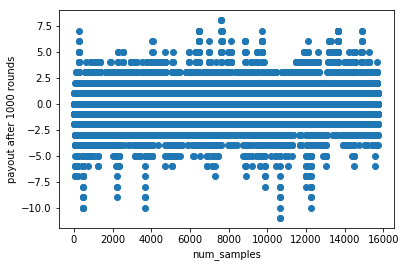

Average payout after 2000 rounds is -1.3065
 Player's  |       Dealer's upcard when ace is not usable        |         Dealer's upcard when ace is usable         
   Hand    | ['A', '2', '3', '4', '5', '6', '7', '8', '9', '10'] | ['A', '2', '3', '4', '5', '6', '7', '8', '9', '10']
         1 | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         2 | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         3 | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         4 | ['S', 'H', 'S', 'H', 'H', 'H', 'H', 'S', 'S', 'H']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         5 | ['S', 'S', 'H', 'H', 'H', 'H', 'S', 'S', 'H', 'H']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         6 | ['H', 'H', 'H', 'S', 'H', 'S', 'H', 'H', 'H', 'H']  | ['-', '-', '-', '-', '-', '-', '-', '-', '-', '-']
         7

In [43]:
plot_result_blackJack(average_payouts,agent)

In [44]:
rew,wP,lP,dP = agent.test(2000)
summary(np.sum(rew) , wP, lP, dP)

player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player winner
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player winner
Draw match
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player winner
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back t

player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player winner
player loser, wont get back the money, try next round
Draw match
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player winner
player loser, wont get back the money, try next round
Draw match
player loser, wont get back the money, try next round
player winner
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player loser, wont get back the money, try next round
player winner
player loser, wont get back the money, try next round
player winner
player loser, wont get back the money, try next round
Draw match
player loser, wont get back the money, try next round
player loser, wont get back the m

## References

>- http://www.gatsby.ucl.ac.uk/~dayan/papers/cjch.pdf
>- https://en.wikipedia.org/wiki/State%E2%80%93action%E2%80%93reward%E2%80%93state%E2%80%93action
>- https://en.wikipedia.org/wiki/Q-learning

# V. Conclusions

Discuss the challenges or somethat that you learned. 
If you have any suggestion about the assignment, you can write about it. 

# Extra Credit for Tournament Top16!

- In two classes, we will have qualification and tournament.
- In qualification game, individual will play against a dealer for one game for 50 round. 
  - Highly ranked (by the profit) and non-broke players will proceed to the tournament.
  - max. 32 players will be cut for main tournament.
- In tournament, 4 players will be play in each round.
  - In a table game, the game lasts until two players broke
  - In final, the game will ends in 50 rounds and winner will be the one with highest balance. 

## Grading

We will test your notebook with an additional grid.txt file. Please make sure to test in different maze input files. 

points | | description
--|--|:--
5 | Overview| states the objective and the appraoch 
35 | Methods | 
 |10| Review of the SARSA and Q-Learning
 | 5| Choice of TD learning and Reason
 | 5| Choice of Function Approximation and Reason
 |10| Implementation of the selected approach (RLAgent)
 | 5| explanation of the codes
45 | Results 
 |10| Reports the selected parameters 
 |15| Experimental outputs that show the choice of parameters. How do you choose them?
 |10| Output plots (5 for each)
 |10| reading and analysis of learning results and plots
10 | Participation to the tournament.
5 | Conclusions 
